In [1]:
!git clone https://github.com/naanadr/pdi_ufrpe.git

fatal: destination path 'pdi_ufrpe' already exists and is not an empty directory.


In [2]:
cd pdi_ufrpe/

/content/pdi_ufrpe


In [0]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Questão 01



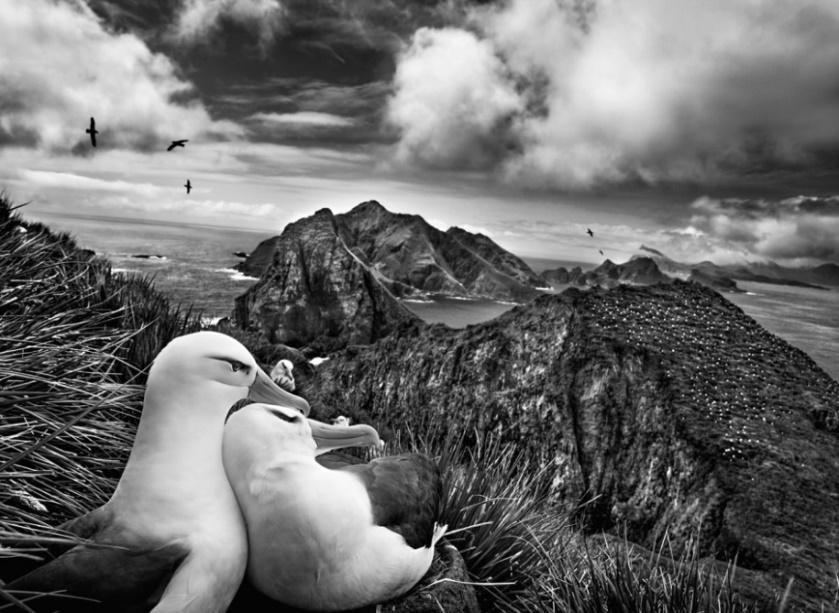

In [4]:
image = cv2.imread('imagens/questao_01.jpg', 0)
height, width = image.shape
cv2_imshow(image)

## a) Implemente um filtro de média


In [0]:
def filtro_media(image, kernel, h, w):
  linha_01 = [image[h-1][w-1], image[h-1][w], image[h-1][w+1]]
  linha_02 = [image[h][w-1], image[h][w], image[h][w+1]]
  linha_03 = [image[h+1][w-1], image[h+1][w], image[h+1][w+1]]

  image_array = np.array([linha_01, linha_02, linha_03])

  new_image = np.multiply(image_array, kernel)
  return np.mean(new_image)

In [0]:
def apply_filtro_media(image, kernel_size):
  kernel = np.ones((kernel_size, kernel_size))
  
  copia = image.copy()
  p_inicio = int(kernel_size / 2)

  for h in range(p_inicio, height-p_inicio):
    for w in range(p_inicio, width-p_inicio):
      copia[h][w] = filtro_media(image, kernel, h, w)
  
  return copia

### Filtro 3x3

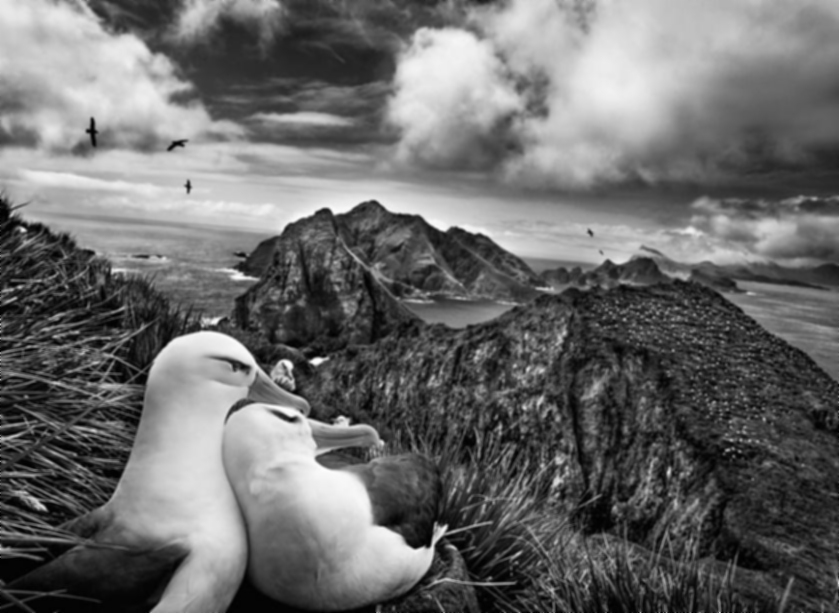

In [7]:
cv2_imshow(apply_filtro_media(image, 3))

## b) Filtro Gaussiano

### Janela 3x3


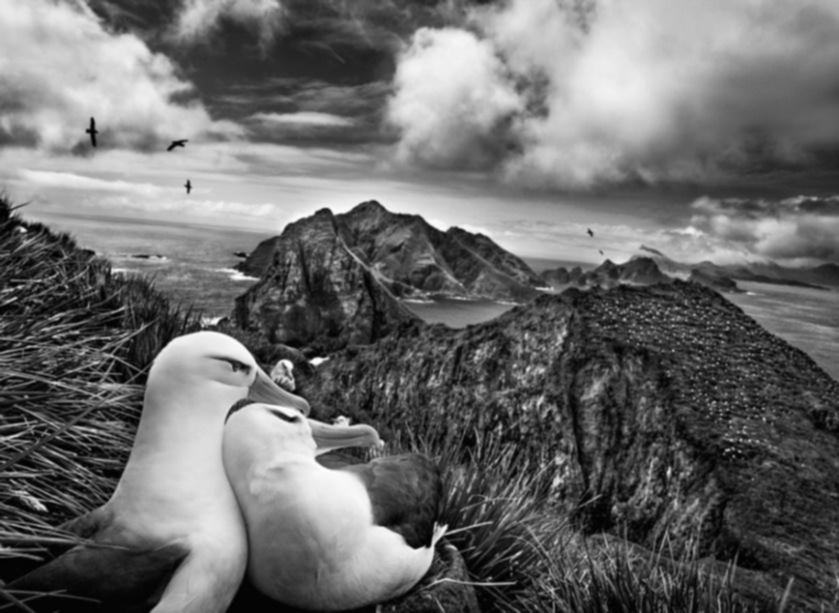

In [8]:
gaussian_image = cv2.GaussianBlur(image, (3, 3),0)
cv2_imshow(gaussian_image)

### Janela 7x7


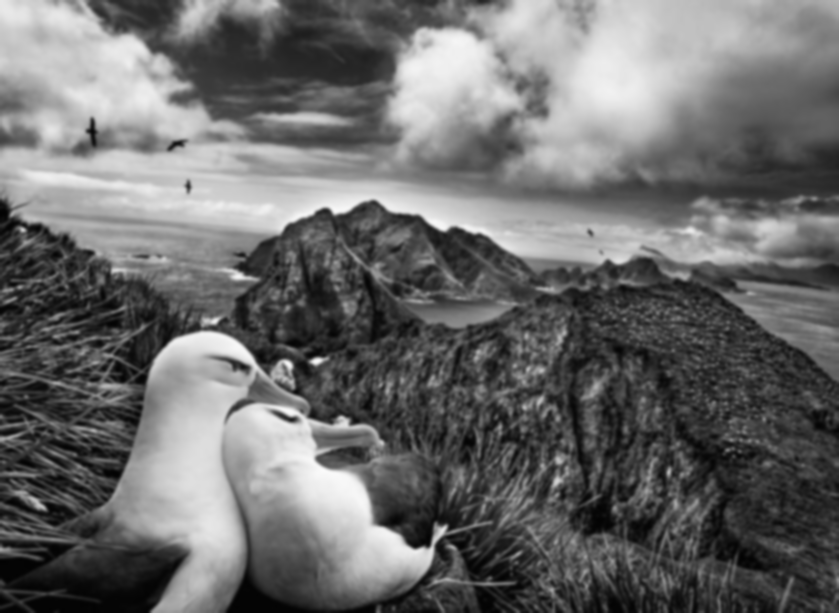

In [9]:
gaussian_image = cv2.GaussianBlur(image, (7, 7),0)
cv2_imshow(gaussian_image)

### Janela 9x9


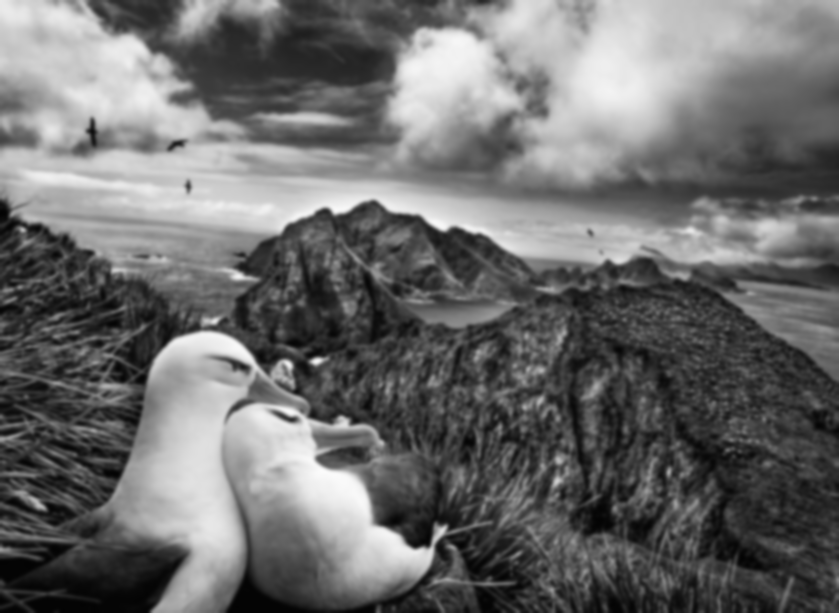

In [10]:
gaussian_image = cv2.GaussianBlur(image, (9, 9),0)
cv2_imshow(gaussian_image)

## c) Filtro Mediana


### Janela 3x3

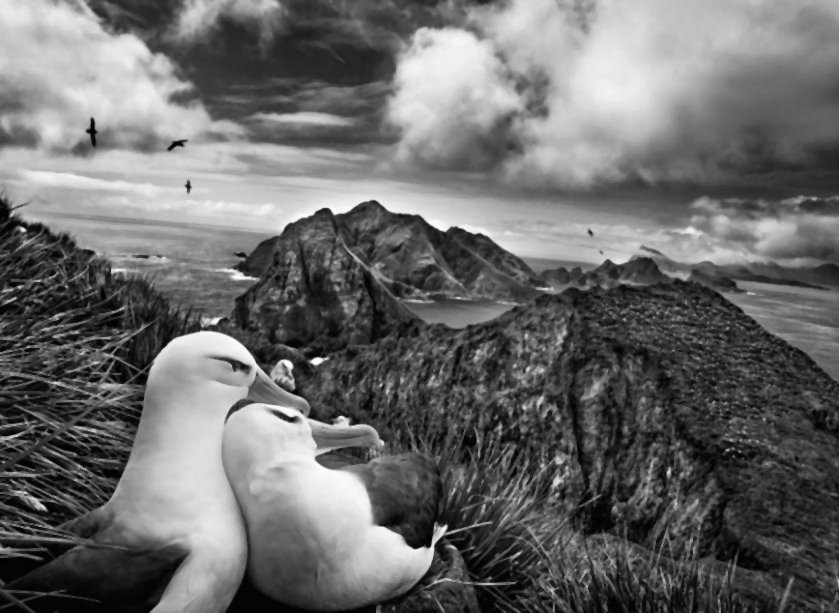

In [11]:
median_image = cv2.medianBlur(image, 3)
cv2_imshow(median_image)

### Janela 7x7

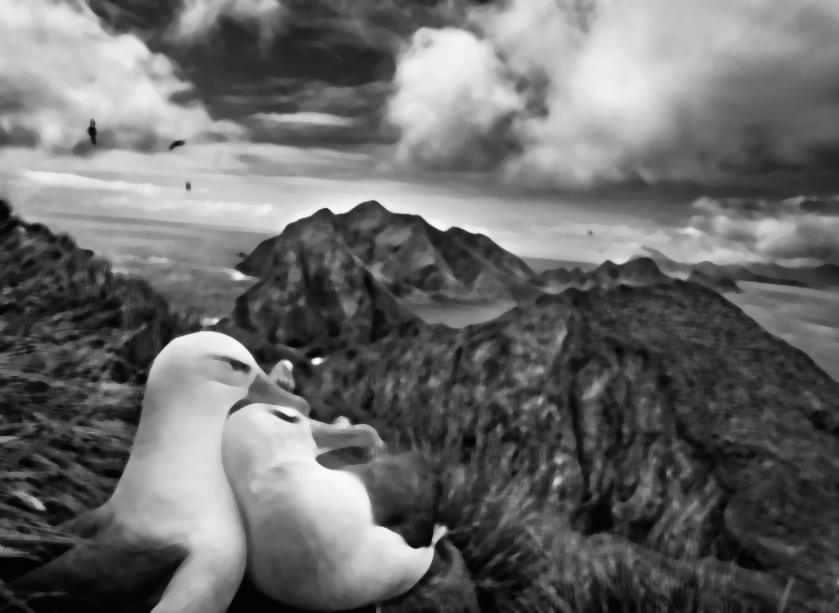

In [12]:
median_image = cv2.medianBlur(image, 7)
cv2_imshow(median_image)

### Janela 9x9

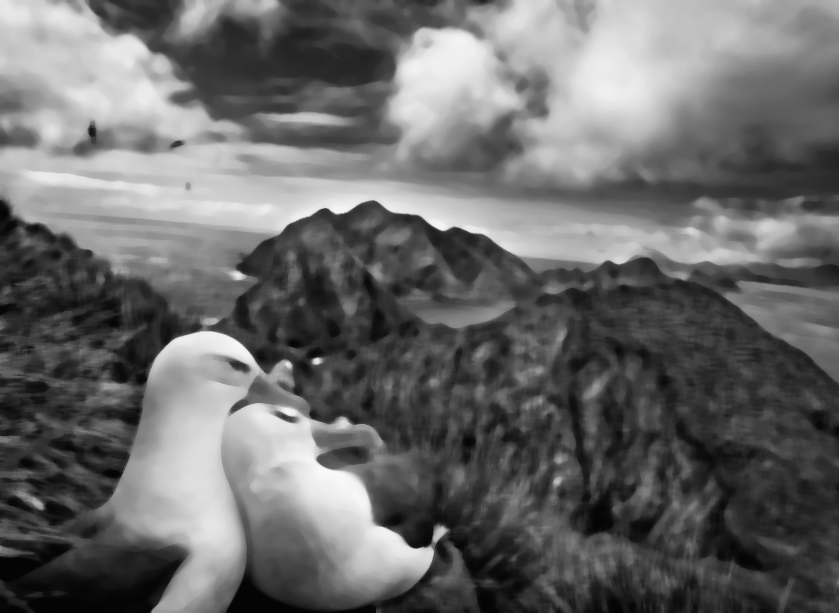

In [13]:
median_image = cv2.medianBlur(image, 9)
cv2_imshow(median_image)

# Questão 02


O filtro de **mediana** é o mais indicado. Pois ele retêm apenas os detalhes da imagem, não se apegando a valores diferentes dos típicos presentes na vizinhança.


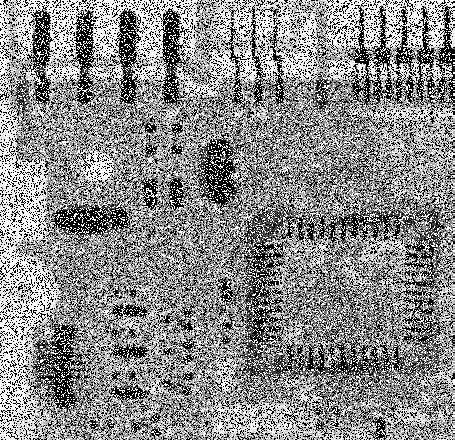

In [17]:
image = cv2.imread('imagens/questao_02.jpg')
cv2_imshow(image)

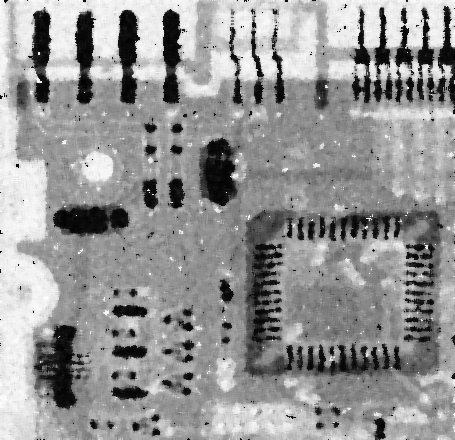

In [20]:
new_image = cv2.medianBlur(image, 5)
cv2_imshow(new_image)

# Questão 03


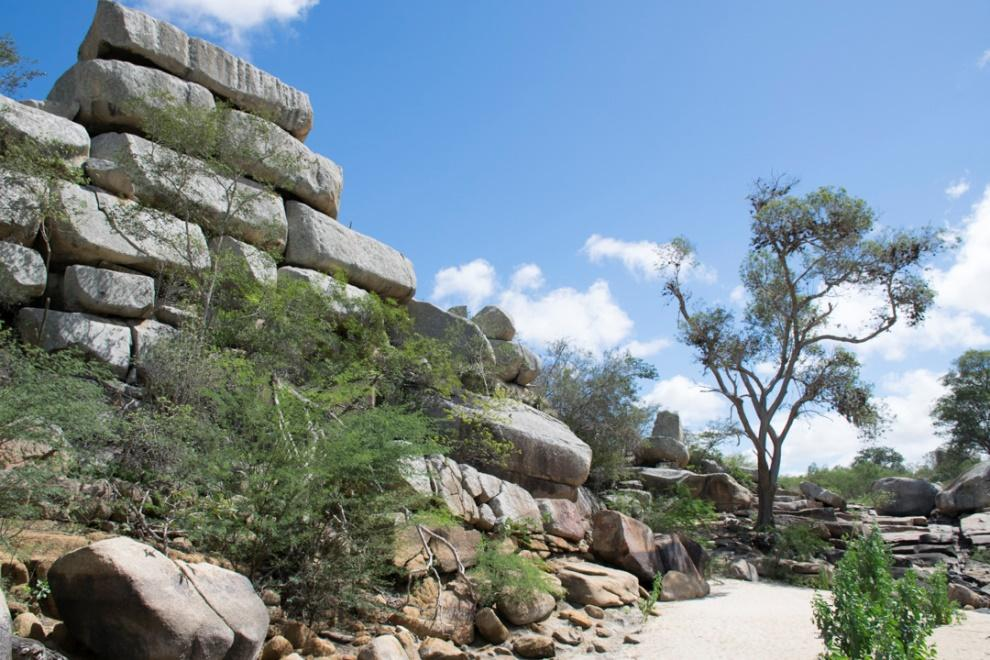

In [23]:
image = cv2.imread('imagens/questao_03.jpg')
cv2_imshow(image)

## a) Filtro para destacar bordas horizontais

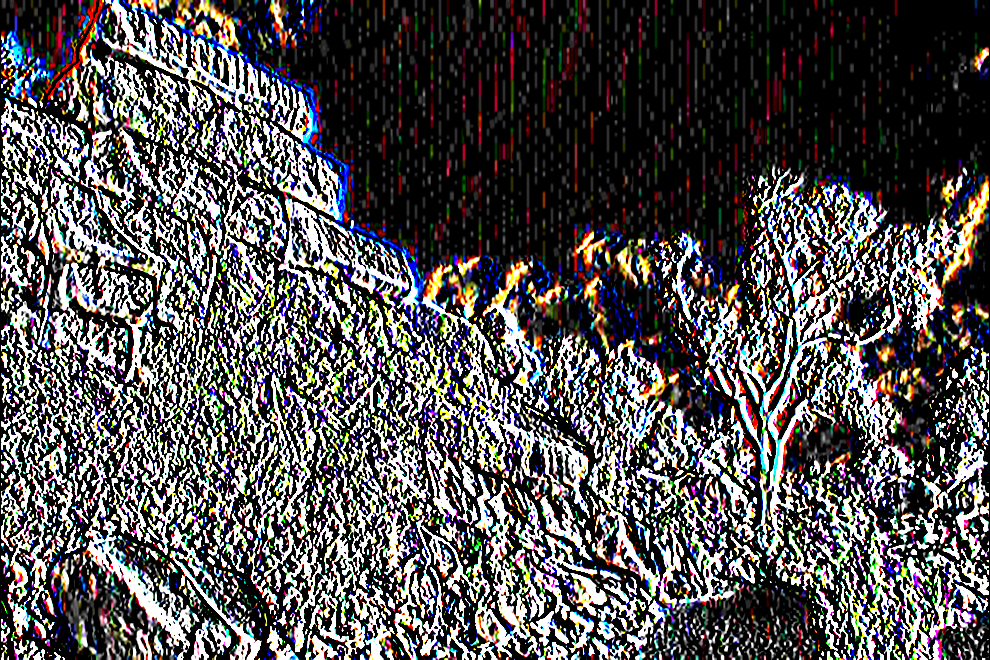

In [25]:
sobelx = cv2.Sobel(image,cv2.CV_64F,1,0,ksize=5)
cv2_imshow(sobelx)

## b) Filtro para destacar bordas verticais

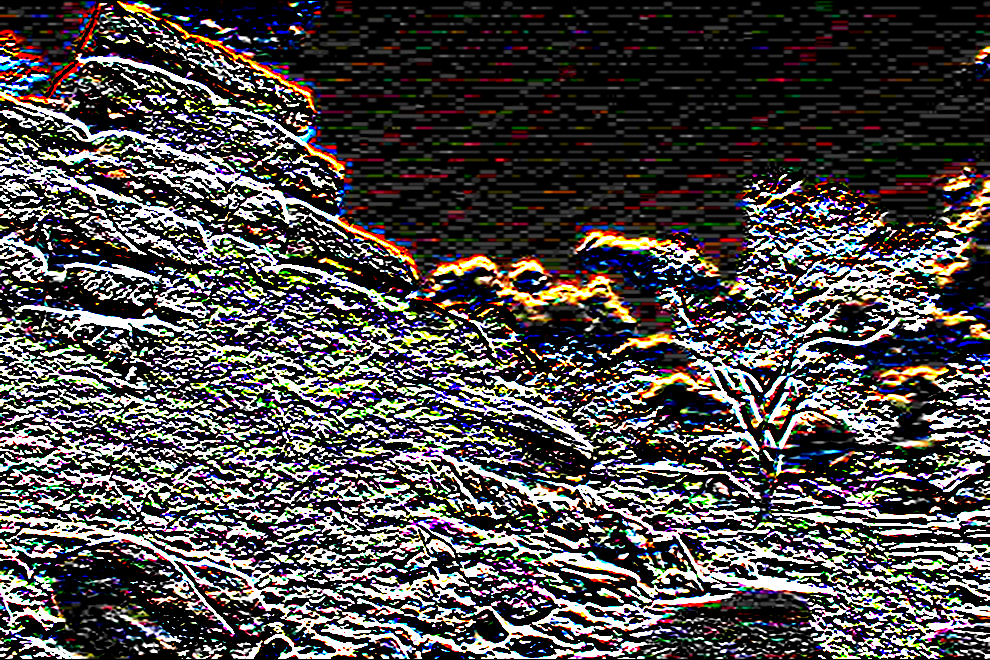

In [26]:
sobely = cv2.Sobel(image,cv2.CV_64F,0,1,ksize=5)
cv2_imshow(sobely)

## c) Filtro para destacar todas as bordas

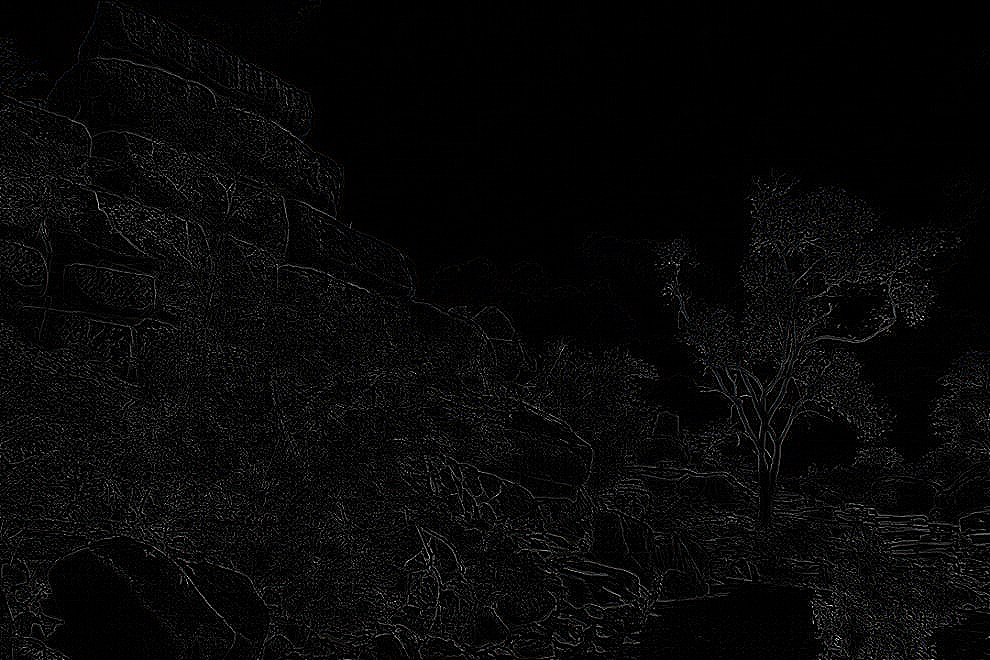

In [27]:
laplacian = cv2.Laplacian(image,cv2.CV_64F)
cv2_imshow(laplacian)

# Questão 04

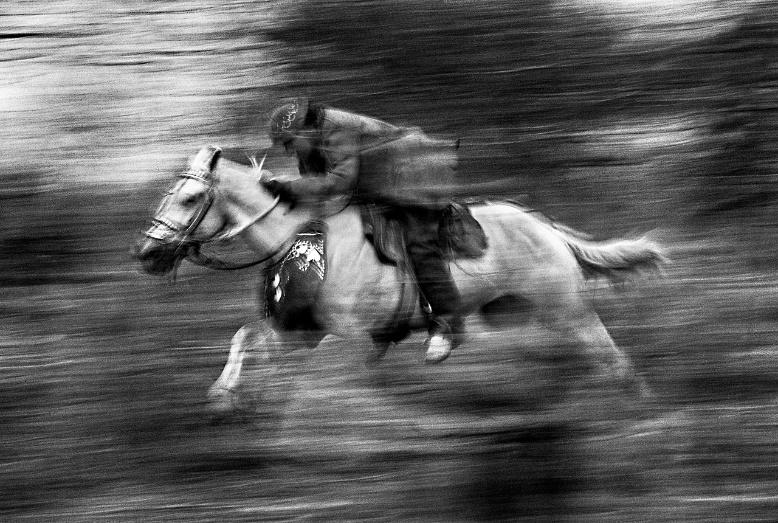

In [42]:
image = cv2.imread('imagens/questao_04.jpg')
cv2_imshow(image)

## Filtro Butterworth (Passa-Baixa)

## Filtro Butterworth (Passa-Alta)

## Filtro Gaussiano (Passa-Baixa)

In [0]:
def gaussian_dft(image, sigma):
  dft = cv2.dft(np.float32(image),flags = cv2.DFT_COMPLEX_OUTPUT) #transformada discreta de fourier
  dft_shift = np.fft.fftshift(dft) #mudança do ponto DC
  
  x_size, y_size = image.shape
  x_arr, y_arr = np.mgrid[0:x_size, 0:y_size]

  cell = (x_size//2, y_size//2)
  dists = np.sqrt((x_arr - cell[0])**2 + (y_arr - cell[1])**2)

  u = 2*(sigma**2)
  arg = -np.divide(dists,u)
  filtg = np.exp(arg)

  mask = np.zeros((x_size, y_size, 2))
  mask[:,:,0] = filtg
  mask[:,:,1] = filtg

  fshift = dft_shift*mask

  f_ishift = np.fft.ifftshift(fshift)
  img_back = cv2.idft(f_ishift)
  img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

  return img_back

### Sigma 5


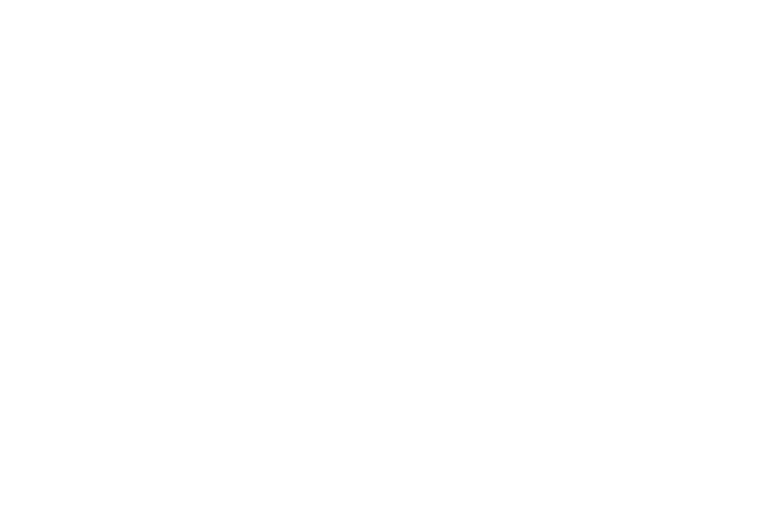

In [58]:
cv2_imshow(gaussian_dft(image, 5))

### Sigma 50

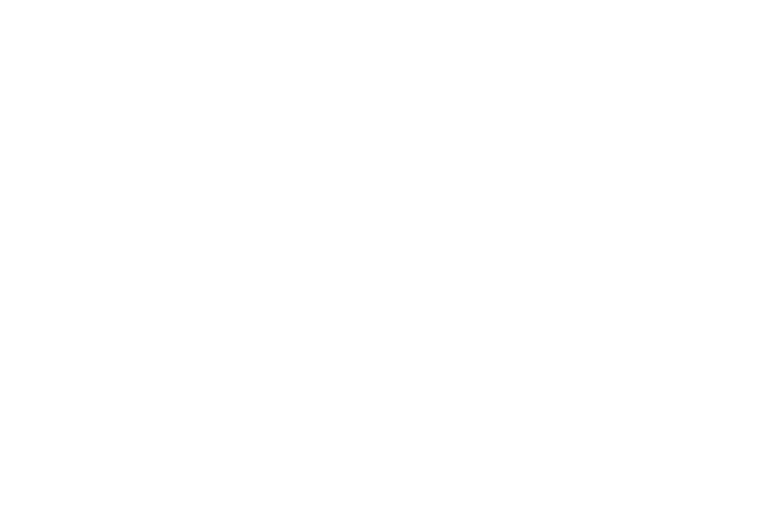

In [59]:
cv2_imshow(gaussian_dft(image, 50))

# Questão 05

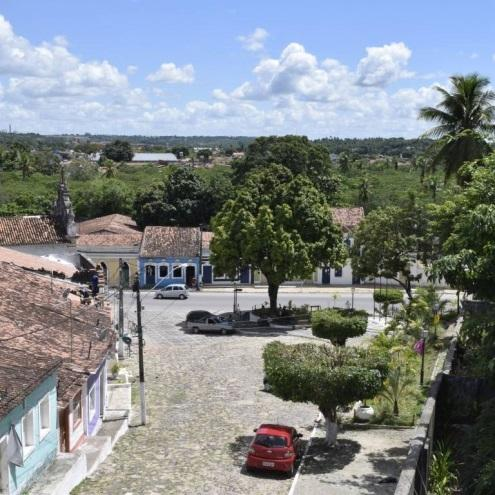

In [123]:
image_original = cv2.imread('imagens/questao_05.jpg')
height, width, _ = image_original.shape
cv2_imshow(image_original)

## Pixel a pixel

In [0]:
def get_value(t_channel):
  if t_channel > 255:
    return 255
  
  return t_channel

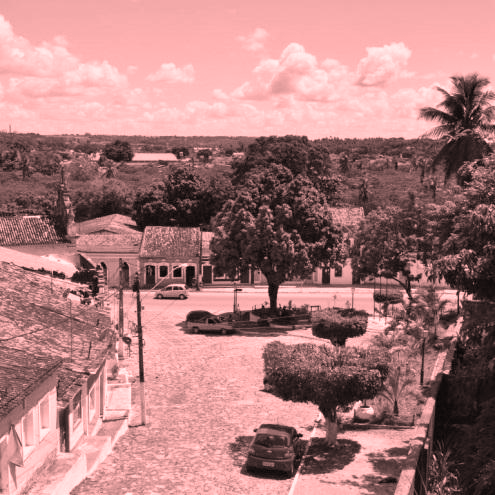

In [84]:
result = image_original.copy()

for h in range(height):
  for w in range(width):
    R = image_original[h, w, 2]
    G = image_original[h, w, 1]
    B = image_original[h, w, 0]

    tr = (0.393 * R) + (0.769 * G) + (0.189 * B)
    tg = (0.349 * R) + (0.686 * G) + (0.168 * B)
    tb = (0.272 * R) + (0.534 * G) + (0.131 * B)

    result[h, w, 2] = get_value(tr)
    result[h, w, 1] = get_value(tb)
    result[h, w, 0] = get_value(tb)
  
cv2_imshow(result)
    

## ColorMap

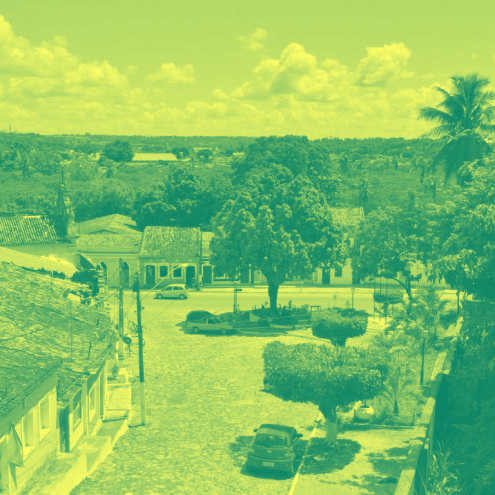

In [87]:
im_color = cv2.applyColorMap(image_original, cv2.COLORMAP_SUMMER)
cv2_imshow(im_color)

## Utilizando os dois resultados

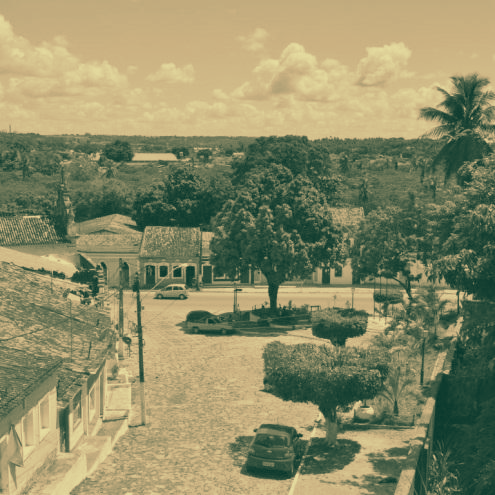

In [124]:
cv2_imshow(cv2.addWeighted(result, 0.5, im_color, 0.4, 0))

# Questão 06

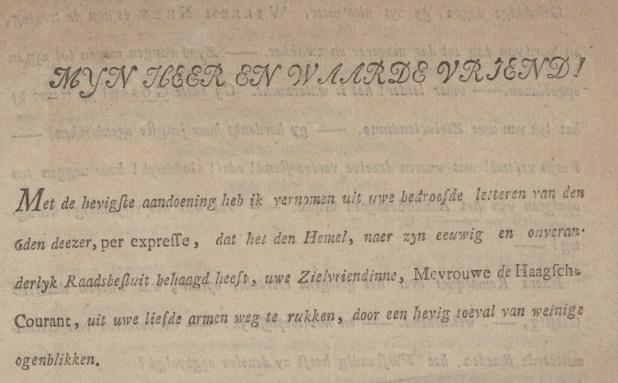

In [188]:
image = cv2.imread('imagens/questao_06.jpg')
cv2_imshow(image)

## Binarizar a imagem

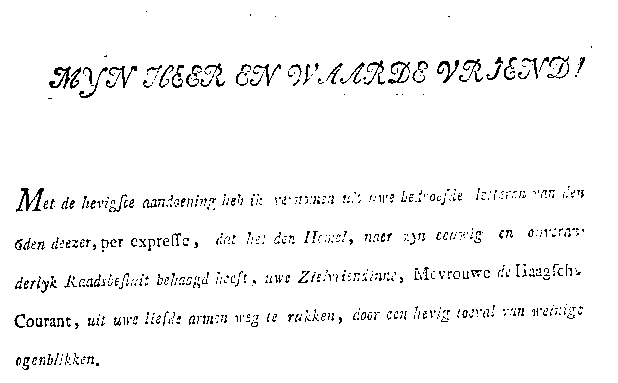

In [192]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

_, th = cv2.threshold(gray,127,255,cv2.THRESH_BINARY)

cv2_imshow(th)

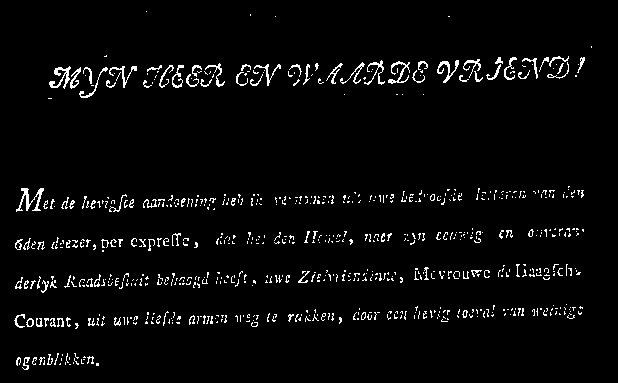

In [143]:
th_inv = cv2.bitwise_not(th)
cv2_imshow(th_inv)

## Aplica dilatação na imagem

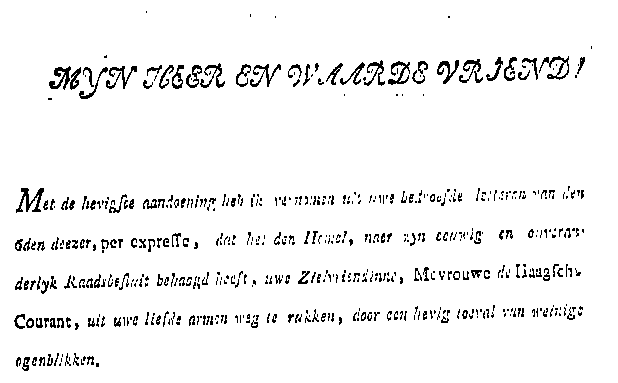

In [173]:
dilate_img = cv2.dilate(th_inv, (11, 11))
dilate_img = cv2.bitwise_not(dilate_img)
cv2_imshow(dilate_img)

## Aplica erosão na imagem

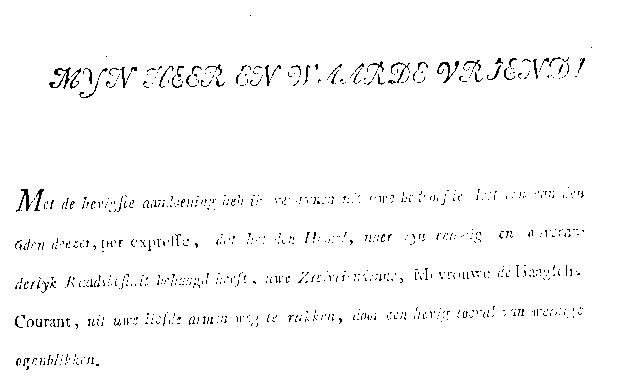

In [146]:
erode_img = cv2.erode(th_inv, (3, 3))
erode_img = cv2.bitwise_not(erode_img)
cv2_imshow(erode_img)

## Deixa legivel

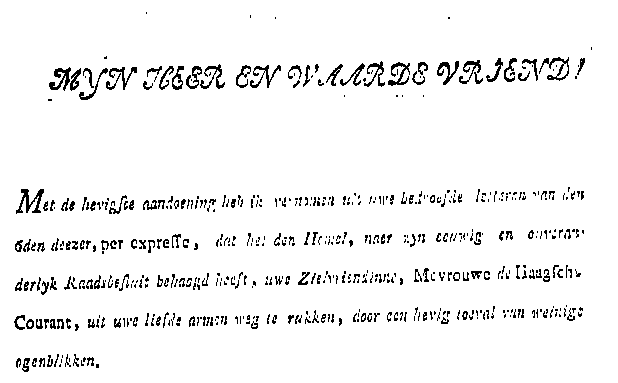

In [181]:
morpholy = cv2.morphologyEx(th_inv, cv2.MORPH_CLOSE, (11, 11))
morpholy = cv2.dilate(morpholy, (9, 9))
morpholy = cv2.bitwise_not(morpholy)
cv2_imshow(morpholy)

### Utilizando Otsu


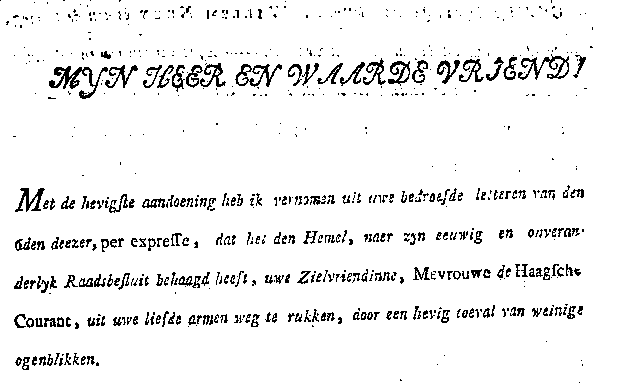

In [193]:
_,th2 = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
cv2_imshow(th2)

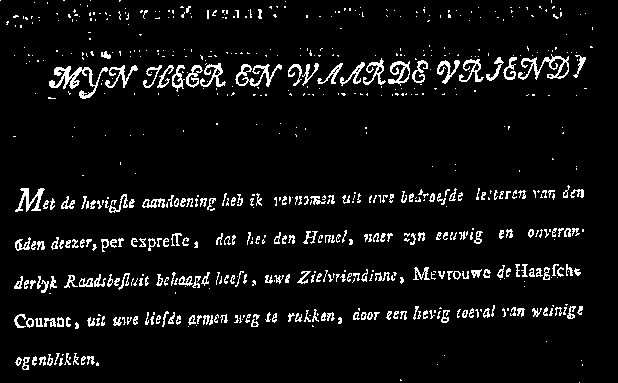

In [194]:
th2_inv = cv2.bitwise_not(th2)
cv2_imshow(th2_inv)

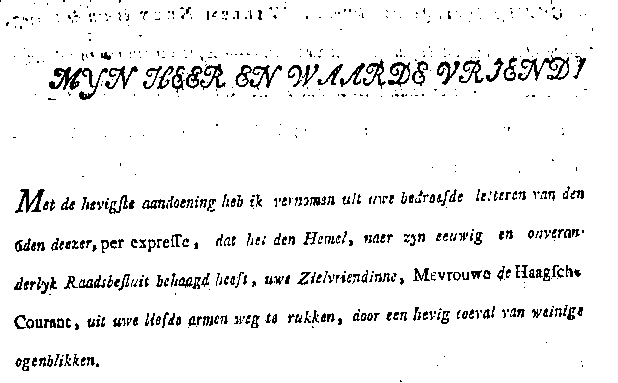

In [201]:
morpholy = cv2.morphologyEx(th2_inv, cv2.MORPH_CLOSE, (7, 7))
morpholy = cv2.bitwise_not(morpholy)
cv2_imshow(morpholy)